# Análisis de Entrenamiento YOLO11

Este notebook permite:
1. Visualizar las métricas de entrenamiento
2. Analizar ejemplos de data augmentation
3. Identificar y visualizar los peores casos predichos
4. Generar reportes de clases problemáticas

In [26]:
import sys
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
import yaml
from ultralytics import YOLO
import json

# Configuración
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
%matplotlib inline

# Paths
project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))

## 1. Cargar Resultados del Entrenamiento

In [27]:
# Configurar el experimento a analizar
experiment_name = "taco_detection_yolo11l_23c_aug_p100_fix_EXIF"  # Cambiar por tu experimento
results_dir = project_root / "runs" / "detect" / experiment_name

print(f"Analizando: {experiment_name}")
print(f"Directorio: {results_dir}")
print(f"Existe: {results_dir.exists()}")

# Cargar resultados CSV
results_csv = results_dir / "results.csv"
if results_csv.exists():
    df_results = pd.read_csv(results_csv)
    # Limpiar nombres de columnas (quitar espacios)
    df_results.columns = df_results.columns.str.strip()
    print(f"\nÉpocas entrenadas: {len(df_results)}")
    print(f"\nColumnas disponibles:")
    print(df_results.columns.tolist())
else:
    print(f"ERROR: No se encontró {results_csv}")

Analizando: taco_detection_yolo11l_23c_aug_p100_fix_EXIF
Directorio: /home/rodrigo/Desktop/maestria/trash-detection/runs/detect/taco_detection_yolo11l_23c_aug_p100_fix_EXIF
Existe: True

Épocas entrenadas: 387

Columnas disponibles:
['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']


## 2. Visualizar Métricas de Entrenamiento

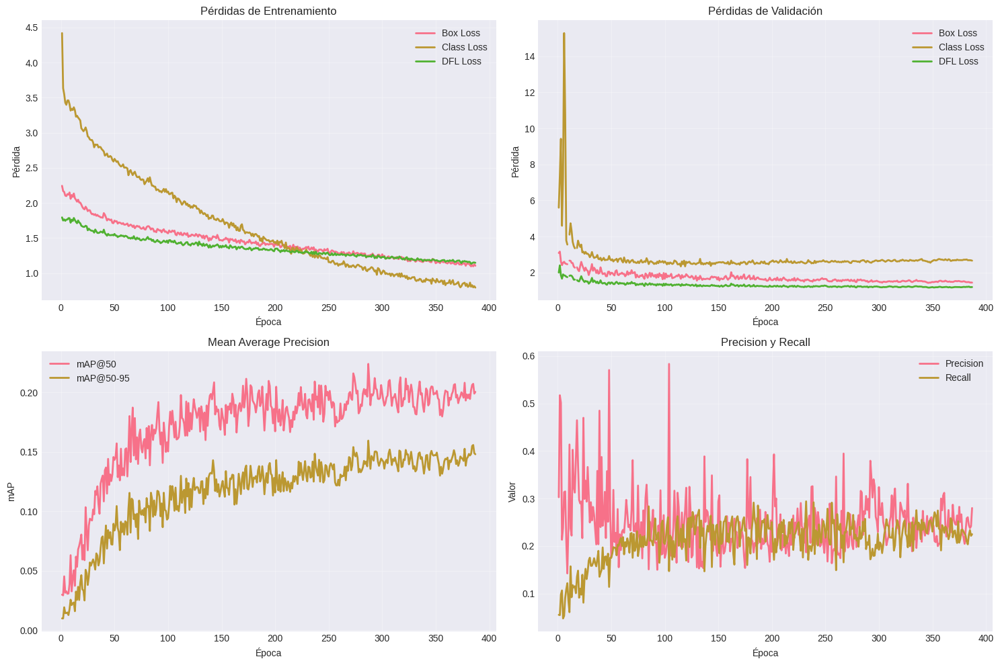


Mejor época: 286
mAP@50-95: 0.1595
mAP@50: 0.2240
Precision: 0.2673
Recall: 0.2572


In [28]:
# Gráfico de pérdidas
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Train losses
ax = axes[0, 0]
ax.plot(df_results['epoch'], df_results['train/box_loss'], label='Box Loss', linewidth=2)
ax.plot(df_results['epoch'], df_results['train/cls_loss'], label='Class Loss', linewidth=2)
ax.plot(df_results['epoch'], df_results['train/dfl_loss'], label='DFL Loss', linewidth=2)
ax.set_xlabel('Época')
ax.set_ylabel('Pérdida')
ax.set_title('Pérdidas de Entrenamiento')
ax.legend()
ax.grid(True, alpha=0.3)

# Val losses
ax = axes[0, 1]
ax.plot(df_results['epoch'], df_results['val/box_loss'], label='Box Loss', linewidth=2)
ax.plot(df_results['epoch'], df_results['val/cls_loss'], label='Class Loss', linewidth=2)
ax.plot(df_results['epoch'], df_results['val/dfl_loss'], label='DFL Loss', linewidth=2)
ax.set_xlabel('Época')
ax.set_ylabel('Pérdida')
ax.set_title('Pérdidas de Validación')
ax.legend()
ax.grid(True, alpha=0.3)

# mAP metrics
ax = axes[1, 0]
ax.plot(df_results['epoch'], df_results['metrics/mAP50(B)'], label='mAP@50', linewidth=2)
ax.plot(df_results['epoch'], df_results['metrics/mAP50-95(B)'], label='mAP@50-95', linewidth=2)
ax.set_xlabel('Época')
ax.set_ylabel('mAP')
ax.set_title('Mean Average Precision')
ax.legend()
ax.grid(True, alpha=0.3)

# Precision & Recall
ax = axes[1, 1]
ax.plot(df_results['epoch'], df_results['metrics/precision(B)'], label='Precision', linewidth=2)
ax.plot(df_results['epoch'], df_results['metrics/recall(B)'], label='Recall', linewidth=2)
ax.set_xlabel('Época')
ax.set_ylabel('Valor')
ax.set_title('Precision y Recall')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Mejor época
best_epoch = df_results['metrics/mAP50-95(B)'].idxmax()
best_map = df_results.loc[best_epoch, 'metrics/mAP50-95(B)']
print(f"\nMejor época: {best_epoch}")
print(f"mAP@50-95: {best_map:.4f}")
print(f"mAP@50: {df_results.loc[best_epoch, 'metrics/mAP50(B)']:.4f}")
print(f"Precision: {df_results.loc[best_epoch, 'metrics/precision(B)']:.4f}")
print(f"Recall: {df_results.loc[best_epoch, 'metrics/recall(B)']:.4f}")

## 3. Visualizar Data Augmentation

Muestra ejemplos de cómo se ven las imágenes después de aplicar augmentation durante el entrenamiento.

/tmp/ipykernel_125397/4284804012.py:28: UserWarning: Argument(s) 'max_holes, max_height, max_width, fill_value' are not valid for transform CoarseDropout
  CoarseDropout(p=0.1, max_holes=8, max_height=32, max_width=32, fill_value=0),


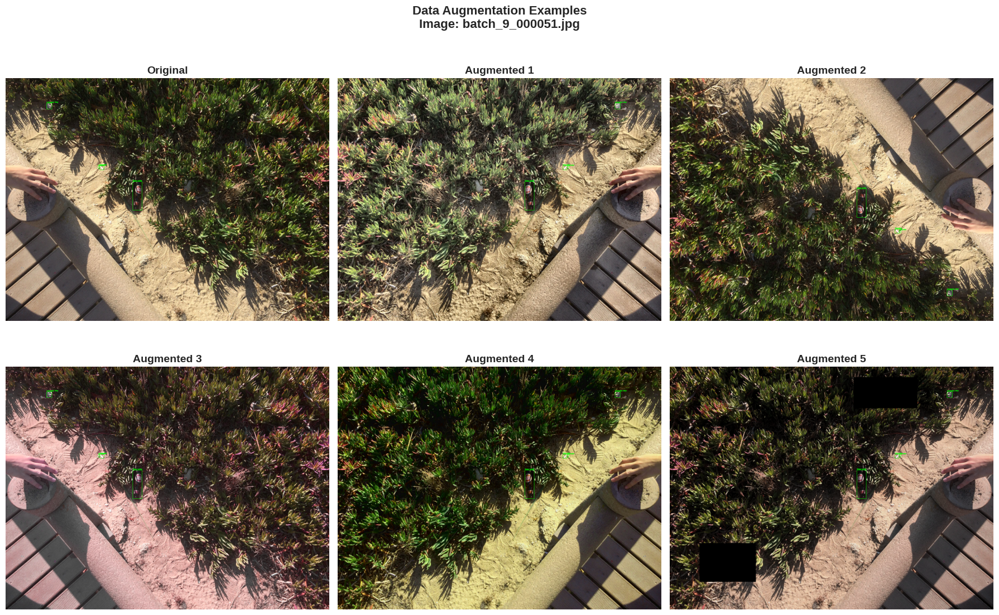


Imagen analizada: batch_9_000051.jpg
Número de objetos: 4
Clases presentes: ['Unlabeled litter', 'Glass bottle', 'Cigarette', 'Cigarette']


In [29]:
from albumentations import (
    Compose, HorizontalFlip, VerticalFlip, RandomRotate90,
    RandomBrightnessContrast, HueSaturationValue, GaussNoise,
    Blur, MedianBlur, MotionBlur, CLAHE, ToGray,
    CoarseDropout, RandomShadow, RandomFog, RandomRain,
    BboxParams
)
import albumentations as A

# Cargar data.yaml para obtener las clases
data_yaml_path = project_root / "data" / "yolo" / "data.yaml"
with open(data_yaml_path, 'r') as f:
    data_config = yaml.safe_load(f)
    class_names = data_config['names']

# Configurar augmentation (similar al entrenamiento)
transform = Compose([
    HorizontalFlip(p=0.5),
    VerticalFlip(p=0.1),
    RandomRotate90(p=0.2),
    RandomBrightnessContrast(p=0.3, brightness_limit=0.2, contrast_limit=0.2),
    HueSaturationValue(p=0.3, hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20),
    GaussNoise(p=0.1),
    Blur(p=0.1, blur_limit=3),
    MedianBlur(p=0.1, blur_limit=3),
    CLAHE(p=0.1),
    ToGray(p=0.05),
    CoarseDropout(p=0.1, max_holes=8, max_height=32, max_width=32, fill_value=0),
], bbox_params=BboxParams(format='yolo', label_fields=['class_labels']))

# Función para dibujar bboxes
def draw_bboxes(image, bboxes, class_labels, class_names):
    """Dibuja bounding boxes en formato YOLO (x_center, y_center, w, h) normalizados"""
    img = image.copy()
    h, w = img.shape[:2]
    
    for bbox, cls_id in zip(bboxes, class_labels):
        x_center, y_center, width, height = bbox
        
        # Convertir de YOLO a pixel coordinates
        x1 = int((x_center - width/2) * w)
        y1 = int((y_center - height/2) * h)
        x2 = int((x_center + width/2) * w)
        y2 = int((y_center + height/2) * h)
        
        # Dibujar bbox
        color = (0, 255, 0)
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
        
        # Dibujar label
        label = class_names[int(cls_id)]
        cv2.putText(img, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 
                   0.5, color, 2)
    
    return img

# Cargar imagen de ejemplo con anotaciones
train_images_dir = project_root / "data" / "yolo" / "train" / "images"
train_labels_dir = project_root / "data" / "yolo" / "train" / "labels"

# Buscar una imagen con anotaciones
image_files = list(train_images_dir.glob("*.jpg"))
if not image_files:
    print("No se encontraron imágenes en train/images")
else:
    # Seleccionar imagen aleatoria
    sample_img_path = np.random.choice(image_files)
    sample_label_path = train_labels_dir / f"{sample_img_path.stem}.txt"
    
    # Cargar imagen
    image = cv2.imread(str(sample_img_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Cargar anotaciones
    bboxes = []
    class_labels = []
    if sample_label_path.exists():
        with open(sample_label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                class_labels.append(int(parts[0]))
                bboxes.append([float(x) for x in parts[1:5]])
    
    # Mostrar original y 5 versiones aumentadas
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    # Original
    img_with_boxes = draw_bboxes(image, bboxes, class_labels, class_names)
    axes[0].imshow(img_with_boxes)
    axes[0].set_title('Original', fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    # Augmented versions
    for i in range(1, 6):
        augmented = transform(image=image, bboxes=bboxes, class_labels=class_labels)
        aug_img = augmented['image']
        aug_bboxes = augmented['bboxes']
        aug_labels = augmented['class_labels']
        
        aug_img_with_boxes = draw_bboxes(aug_img, aug_bboxes, aug_labels, class_names)
        axes[i].imshow(aug_img_with_boxes)
        axes[i].set_title(f'Augmented {i}', fontsize=14, fontweight='bold')
        axes[i].axis('off')
    
    plt.suptitle(f'Data Augmentation Examples\nImage: {sample_img_path.name}', 
                fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    print(f"\nImagen analizada: {sample_img_path.name}")
    print(f"Número de objetos: {len(bboxes)}")
    print(f"Clases presentes: {[class_names[int(c)] for c in class_labels]}")

## 4. Analizar Peores Predicciones

Identifica y visualiza los casos donde el modelo tiene peor desempeño.

In [30]:
# Cargar el mejor modelo
best_weights = results_dir / "weights" / "best.pt"

if not best_weights.exists():
    print(f"ERROR: No se encontró {best_weights}")
else:
    print(f"Cargando modelo: {best_weights}")
    model = YOLO(str(best_weights))
    print("Modelo cargado exitosamente")
    
    # Validar en el conjunto de validación para obtener métricas detalladas
    val_images_dir = project_root / "data" / "yolo" / "val" / "images"
    data_yaml = project_root / "data" / "yolo" / "data.yaml"
    
    print("\nEjecutando validación...")
    metrics = model.val(data=str(data_yaml), split='val', conf=0.25, iou=0.45, verbose=False)
    
    print(f"\nResultados de validación:")
    print(f"mAP@50: {metrics.box.map50:.4f}")
    print(f"mAP@50-95: {metrics.box.map:.4f}")
    print(f"Precision: {metrics.box.mp:.4f}")
    print(f"Recall: {metrics.box.mr:.4f}")

Cargando modelo: /home/rodrigo/Desktop/maestria/trash-detection/runs/detect/taco_detection_yolo11l_23c_aug_p100_fix_EXIF/weights/best.pt
Modelo cargado exitosamente

Ejecutando validación...
Ultralytics 8.3.225 🚀 Python-3.12.9 torch-2.9.0+cu128 CUDA:0 (NVIDIA RTX A5000, 24238MiB)
YOLO11l summary (fused): 190 layers, 25,297,045 parameters, 0 gradients, 86.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 11801.5±2631.6 MB/s, size: 1134.1 KB)
val: Scanning /home/rodrigo/Desktop/maestria/trash-detection/data/yolo/val/labels.cache... 167 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 167/167 633.3Kit/s 0.0s
YOLO11l summary (fused): 190 layers, 25,297,045 parameters, 0 gradients, 86.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 11801.5±2631.6 MB/s, size: 1134.1 KB)
val: Scanning /home/rodrigo/Desktop/maestria/trash-detection/data/yolo/val/labels.cache... 167 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 167/167 633.3Kit/s 0.0s
                 Class     Imag

In [31]:
# Función para calcular IoU
def calculate_iou(box1, box2):
    """Calcula IoU entre dos boxes en formato [x1, y1, x2, y2]"""
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    
    if x2 < x1 or y2 < y1:
        return 0.0
    
    intersection = (x2 - x1) * (y2 - y1)
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection
    
    return intersection / union if union > 0 else 0.0

# Evaluar todas las imágenes de validación y encontrar las peores
val_images = list(val_images_dir.glob("*.jpg"))
val_labels_dir = project_root / "data" / "yolo" / "val" / "labels"

print(f"Analizando {len(val_images)} imágenes de validación...")

image_scores = []

for img_path in val_images[:100]:  # Analizar primeras 100 para velocidad
    # Cargar ground truth
    label_path = val_labels_dir / f"{img_path.stem}.txt"
    
    gt_boxes = []
    gt_classes = []
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                gt_classes.append(int(parts[0]))
                # Convertir de YOLO a xyxy
                img = Image.open(img_path)
                w, h = img.size
                x_c, y_c, box_w, box_h = [float(x) for x in parts[1:5]]
                x1 = (x_c - box_w/2) * w
                y1 = (y_c - box_h/2) * h
                x2 = (x_c + box_w/2) * w
                y2 = (y_c + box_h/2) * h
                gt_boxes.append([x1, y1, x2, y2])
    
    if len(gt_boxes) == 0:
        continue
    
    # Predecir
    results = model.predict(str(img_path), conf=0.25, iou=0.45, verbose=False)
    
    # Calcular score (promedio de max IoU para cada GT box)
    if len(results) > 0 and results[0].boxes is not None:
        pred_boxes = results[0].boxes.xyxy.cpu().numpy()
        
        ious = []
        for gt_box in gt_boxes:
            max_iou = 0
            for pred_box in pred_boxes:
                iou = calculate_iou(gt_box, pred_box)
                max_iou = max(max_iou, iou)
            ious.append(max_iou)
        
        avg_iou = np.mean(ious)
    else:
        avg_iou = 0.0  # No predictions
    
    image_scores.append({
        'path': img_path,
        'score': avg_iou,
        'num_gt': len(gt_boxes),
        'num_pred': len(pred_boxes) if len(results) > 0 and results[0].boxes is not None else 0
    })

# Ordenar por peor score
image_scores.sort(key=lambda x: x['score'])

print(f"\nAnálisis completado. Peores {min(10, len(image_scores))} casos:")
for i, score_info in enumerate(image_scores[:10]):
    print(f"{i+1}. {score_info['path'].name}: IoU={score_info['score']:.3f}, "
          f"GT={score_info['num_gt']}, Pred={score_info['num_pred']}")

Analizando 100 imágenes de validación...

Análisis completado. Peores 10 casos:
1. batch_14_000084.jpg: IoU=0.000, GT=1, Pred=0
2. batch_8_000015.jpg: IoU=0.000, GT=3, Pred=0
3. batch_10_000045.jpg: IoU=0.000, GT=1, Pred=0
4. batch_14_000005.jpg: IoU=0.000, GT=1, Pred=0
5. batch_10_000034.jpg: IoU=0.000, GT=21, Pred=0
6. batch_10_000032.jpg: IoU=0.000, GT=1, Pred=0
7. batch_13_000047.jpg: IoU=0.000, GT=1, Pred=1
8. batch_9_000054.jpg: IoU=0.000, GT=9, Pred=0
9. batch_15_000084.jpg: IoU=0.000, GT=2, Pred=0
10. batch_9_000087.jpg: IoU=0.000, GT=2, Pred=1

Análisis completado. Peores 10 casos:
1. batch_14_000084.jpg: IoU=0.000, GT=1, Pred=0
2. batch_8_000015.jpg: IoU=0.000, GT=3, Pred=0
3. batch_10_000045.jpg: IoU=0.000, GT=1, Pred=0
4. batch_14_000005.jpg: IoU=0.000, GT=1, Pred=0
5. batch_10_000034.jpg: IoU=0.000, GT=21, Pred=0
6. batch_10_000032.jpg: IoU=0.000, GT=1, Pred=0
7. batch_13_000047.jpg: IoU=0.000, GT=1, Pred=1
8. batch_9_000054.jpg: IoU=0.000, GT=9, Pred=0
9. batch_15_000084.

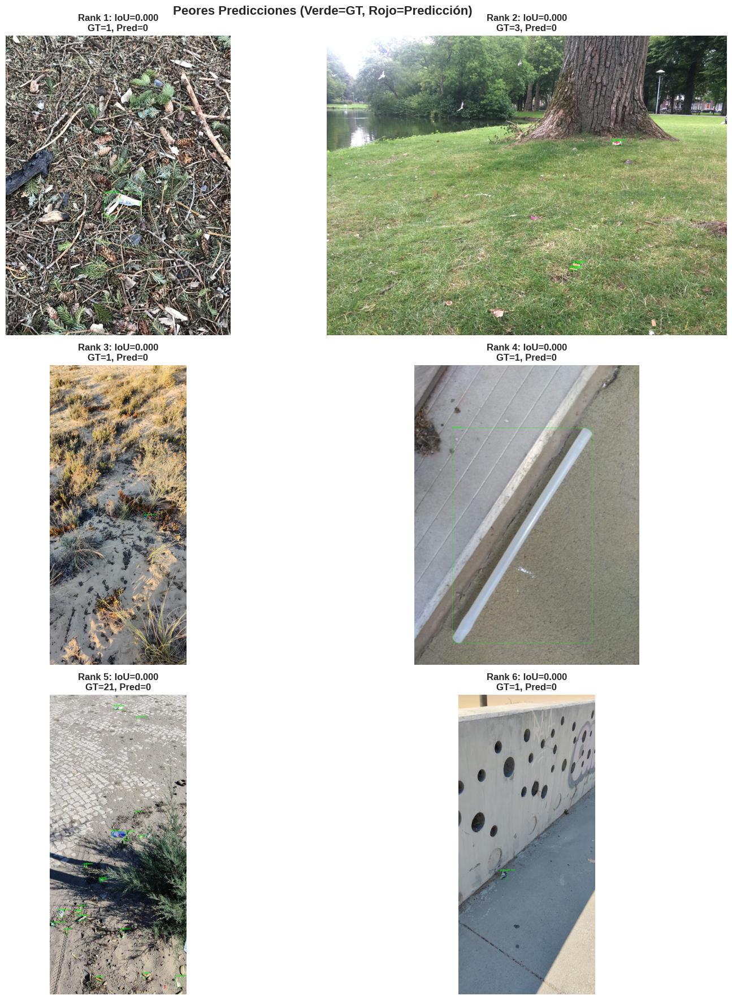

In [32]:
# Visualizar los 6 peores casos
fig, axes = plt.subplots(3, 2, figsize=(16, 18))
axes = axes.flatten()

for idx, score_info in enumerate(image_scores[:6]):
    img_path = score_info['path']
    
    # Cargar imagen
    image = cv2.imread(str(img_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w = image.shape[:2]
    
    # Cargar ground truth
    label_path = val_labels_dir / f"{img_path.stem}.txt"
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            cls_id = int(parts[0])
            x_c, y_c, box_w, box_h = [float(x) for x in parts[1:5]]
            
            # Convertir a pixel coords
            x1 = int((x_c - box_w/2) * w)
            y1 = int((y_c - box_h/2) * h)
            x2 = int((x_c + box_w/2) * w)
            y2 = int((y_c + box_h/2) * h)
            
            # Dibujar GT en verde
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image, f"GT: {class_names[cls_id]}", (x1, y1-5), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    
    # Predecir
    results = model.predict(str(img_path), conf=0.25, iou=0.45, verbose=False)
    
    if len(results) > 0 and results[0].boxes is not None:
        boxes = results[0].boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
            conf = box.conf[0].cpu().numpy()
            cls = int(box.cls[0].cpu().numpy())
            
            # Dibujar predicción en rojo
            cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
            cv2.putText(image, f"Pred: {class_names[cls]} {conf:.2f}", 
                       (x1, y2+15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    
    axes[idx].imshow(image)
    axes[idx].set_title(f"Rank {idx+1}: IoU={score_info['score']:.3f}\n"
                       f"GT={score_info['num_gt']}, Pred={score_info['num_pred']}",
                       fontsize=12, fontweight='bold')
    axes[idx].axis('off')

plt.suptitle('Peores Predicciones (Verde=GT, Rojo=Predicción)', 
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

### 4.1 Análisis Detallado de Peores Casos

Análisis en profundidad de los casos con peor desempeño para identificar patrones comunes.

ESTADÍSTICAS DE LOS 20 PEORES CASOS
IoU promedio: 0.000
Objetos GT promedio: 3.1
Objetos predichos promedio: 0.4

Distribución de IoU:
  IoU = 0 (sin detecciones): 20
  IoU < 0.3 (muy bajo): 0
  IoU 0.3-0.5 (bajo): 0


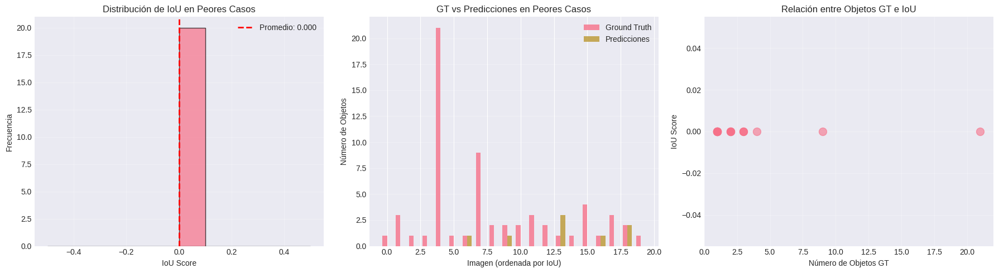

In [33]:
# Análisis estadístico de los peores casos
worst_cases = image_scores[:20]

# Estadísticas
avg_iou_worst = np.mean([case['score'] for case in worst_cases])
avg_gt_worst = np.mean([case['num_gt'] for case in worst_cases])
avg_pred_worst = np.mean([case['num_pred'] for case in worst_cases])

print("ESTADÍSTICAS DE LOS 20 PEORES CASOS")
print("="*60)
print(f"IoU promedio: {avg_iou_worst:.3f}")
print(f"Objetos GT promedio: {avg_gt_worst:.1f}")
print(f"Objetos predichos promedio: {avg_pred_worst:.1f}")
print(f"\nDistribución de IoU:")
print(f"  IoU = 0 (sin detecciones): {sum(1 for c in worst_cases if c['score'] == 0)}")
print(f"  IoU < 0.3 (muy bajo): {sum(1 for c in worst_cases if 0 < c['score'] < 0.3)}")
print(f"  IoU 0.3-0.5 (bajo): {sum(1 for c in worst_cases if 0.3 <= c['score'] < 0.5)}")

# Gráfico de distribución
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# IoU distribution
ax = axes[0]
iou_scores = [case['score'] for case in worst_cases]
ax.hist(iou_scores, bins=10, edgecolor='black', alpha=0.7)
ax.axvline(avg_iou_worst, color='red', linestyle='--', linewidth=2, label=f'Promedio: {avg_iou_worst:.3f}')
ax.set_xlabel('IoU Score')
ax.set_ylabel('Frecuencia')
ax.set_title('Distribución de IoU en Peores Casos')
ax.legend()
ax.grid(True, alpha=0.3)

# GT vs Pred objects
ax = axes[1]
gt_counts = [case['num_gt'] for case in worst_cases]
pred_counts = [case['num_pred'] for case in worst_cases]
x = np.arange(len(worst_cases))
width = 0.35
ax.bar(x - width/2, gt_counts, width, label='Ground Truth', alpha=0.8)
ax.bar(x + width/2, pred_counts, width, label='Predicciones', alpha=0.8)
ax.set_xlabel('Imagen (ordenada por IoU)')
ax.set_ylabel('Número de Objetos')
ax.set_title('GT vs Predicciones en Peores Casos')
ax.legend()
ax.grid(True, alpha=0.3, axis='y')

# Scatter: GT vs IoU
ax = axes[2]
ax.scatter(gt_counts, iou_scores, alpha=0.6, s=100)
ax.set_xlabel('Número de Objetos GT')
ax.set_ylabel('IoU Score')
ax.set_title('Relación entre Objetos GT e IoU')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


CLASES PRESENTES EN LOS 20 PEORES CASOS

Clases más frecuentes en peores casos:
 1. Cigarette                     :  20 objetos
 2. Unlabeled litter              :  10 objetos
 3. Other plastic wrapper         :   5 objetos
 4. Glass bottle                  :   4 objetos
 5. Styrofoam piece               :   4 objetos
 6. Pop tab                       :   3 objetos
 7. Other plastic                 :   3 objetos
 8. Drink can                     :   2 objetos
 9. Plastic straw                 :   2 objetos
10. Normal paper                  :   2 objetos


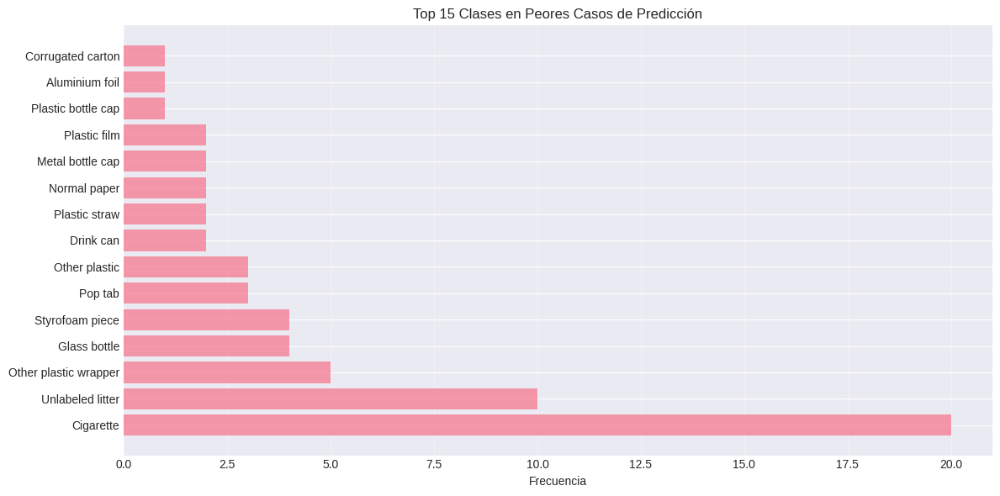

In [34]:
# Analizar clases presentes en los peores casos
print("\nCLASES PRESENTES EN LOS 20 PEORES CASOS")
print("="*60)

class_count_in_worst = {}
for case in worst_cases[:20]:
    img_path = case['path']
    label_path = val_labels_dir / f"{img_path.stem}.txt"
    
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                cls_id = int(line.strip().split()[0])
                cls_name = class_names[cls_id]
                class_count_in_worst[cls_name] = class_count_in_worst.get(cls_name, 0) + 1

# Ordenar por frecuencia
sorted_classes = sorted(class_count_in_worst.items(), key=lambda x: x[1], reverse=True)

print("\nClases más frecuentes en peores casos:")
for i, (cls_name, count) in enumerate(sorted_classes[:10], 1):
    print(f"{i:2d}. {cls_name:30s}: {count:3d} objetos")

# Visualizar
if len(sorted_classes) > 0:
    fig, ax = plt.subplots(figsize=(12, 6))
    classes, counts = zip(*sorted_classes[:15])
    ax.barh(range(len(classes)), counts, alpha=0.7)
    ax.set_yticks(range(len(classes)))
    ax.set_yticklabels(classes)
    ax.set_xlabel('Frecuencia')
    ax.set_title('Top 15 Clases en Peores Casos de Predicción')
    ax.grid(True, alpha=0.3, axis='x')
    plt.tight_layout()
    plt.show()

### 4.2 Análisis de Errores Específicos

Clasificación de tipos de errores: falsos negativos, falsos positivos, errores de localización.

ANÁLISIS DE TIPOS DE ERROR EN PEORES CASOS

Falsos Negativos (no detectados): 42
Errores de Localización (IoU 0.3-0.5): 0
Falsos Positivos (predicciones incorrectas): 2
Detecciones Correctas (IoU >= 0.5): 0

Falsos Negativos (no detectados): 42
Errores de Localización (IoU 0.3-0.5): 0
Falsos Positivos (predicciones incorrectas): 2
Detecciones Correctas (IoU >= 0.5): 0


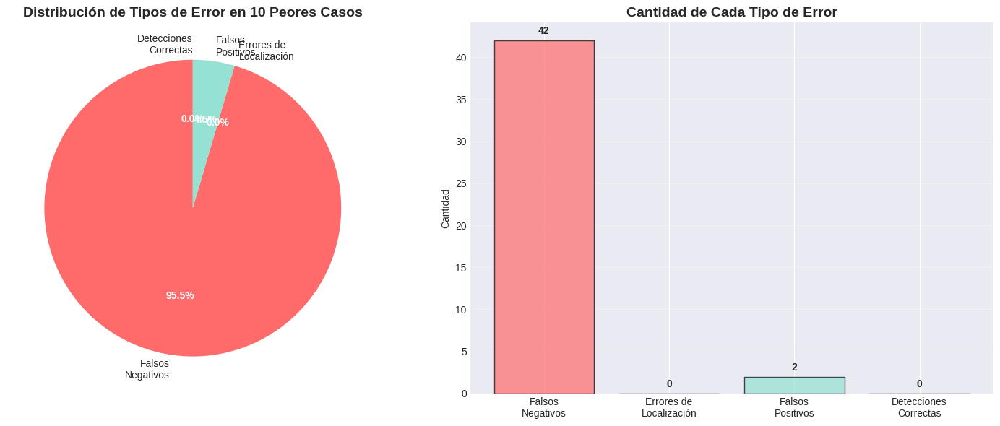

In [35]:
# Clasificar tipos de errores en los peores casos
error_analysis = {
    'false_negatives': [],  # GT no detectados (IoU < 0.3)
    'false_positives': [],  # Predicciones sin GT correspondiente
    'localization_errors': [],  # Detectado pero mal localizado (0.3 <= IoU < 0.5)
    'correct_detections': []  # Bien detectado (IoU >= 0.5)
}

print("ANÁLISIS DE TIPOS DE ERROR EN PEORES CASOS")
print("="*60)

for case in worst_cases[:10]:
    img_path = case['path']
    label_path = val_labels_dir / f"{img_path.stem}.txt"
    
    # Cargar GT
    gt_boxes = []
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                img_temp = Image.open(img_path)
                w, h = img_temp.size
                x_c, y_c, box_w, box_h = [float(x) for x in parts[1:5]]
                x1 = (x_c - box_w/2) * w
                y1 = (y_c - box_h/2) * h
                x2 = (x_c + box_w/2) * w
                y2 = (y_c + box_h/2) * h
                gt_boxes.append([x1, y1, x2, y2])
    
    # Predecir
    results = model.predict(str(img_path), conf=0.25, iou=0.45, verbose=False)
    pred_boxes = []
    if len(results) > 0 and results[0].boxes is not None:
        pred_boxes = results[0].boxes.xyxy.cpu().numpy()
    
    # Calcular IoU para cada GT box
    matched_preds = set()
    for gt_box in gt_boxes:
        max_iou = 0
        best_pred_idx = -1
        
        for pred_idx, pred_box in enumerate(pred_boxes):
            iou = calculate_iou(gt_box, pred_box)
            if iou > max_iou:
                max_iou = iou
                best_pred_idx = pred_idx
        
        if max_iou >= 0.5:
            error_analysis['correct_detections'].append(max_iou)
            if best_pred_idx >= 0:
                matched_preds.add(best_pred_idx)
        elif max_iou >= 0.3:
            error_analysis['localization_errors'].append(max_iou)
            if best_pred_idx >= 0:
                matched_preds.add(best_pred_idx)
        else:
            error_analysis['false_negatives'].append(0)
    
    # Predicciones no matcheadas = falsos positivos
    for pred_idx in range(len(pred_boxes)):
        if pred_idx not in matched_preds:
            error_analysis['false_positives'].append(1)

# Resumen
print(f"\nFalsos Negativos (no detectados): {len(error_analysis['false_negatives'])}")
print(f"Errores de Localización (IoU 0.3-0.5): {len(error_analysis['localization_errors'])}")
print(f"Falsos Positivos (predicciones incorrectas): {len(error_analysis['false_positives'])}")
print(f"Detecciones Correctas (IoU >= 0.5): {len(error_analysis['correct_detections'])}")

# Visualizar
labels = ['Falsos\nNegativos', 'Errores de\nLocalización', 'Falsos\nPositivos', 'Detecciones\nCorrectas']
counts = [
    len(error_analysis['false_negatives']),
    len(error_analysis['localization_errors']),
    len(error_analysis['false_positives']),
    len(error_analysis['correct_detections'])
]
colors = ['#ff6b6b', '#ffd93d', '#95e1d3', '#6bcf7f']

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Pie chart
ax = axes[0]
wedges, texts, autotexts = ax.pie(counts, labels=labels, autopct='%1.1f%%', 
                                    colors=colors, startangle=90)
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')
ax.set_title('Distribución de Tipos de Error en 10 Peores Casos', fontsize=14, fontweight='bold')

# Bar chart
ax = axes[1]
ax.bar(labels, counts, color=colors, alpha=0.7, edgecolor='black')
ax.set_ylabel('Cantidad')
ax.set_title('Cantidad de Cada Tipo de Error', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')

# Agregar valores en las barras
for i, (label, count) in enumerate(zip(labels, counts)):
    ax.text(i, count + 0.5, str(count), ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

### 4.3 Casos Específicos con Anotaciones Problemáticas

Visualización detallada de casos individuales para identificar problemas de anotación.

ANÁLISIS DETALLADO DE CASOS INDIVIDUALES


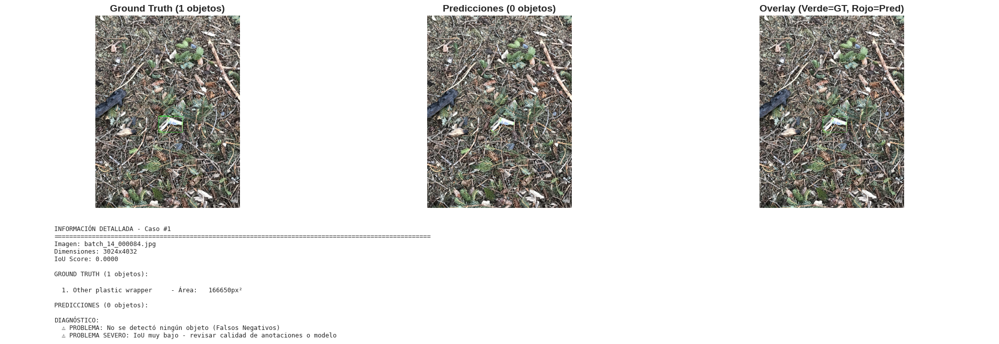

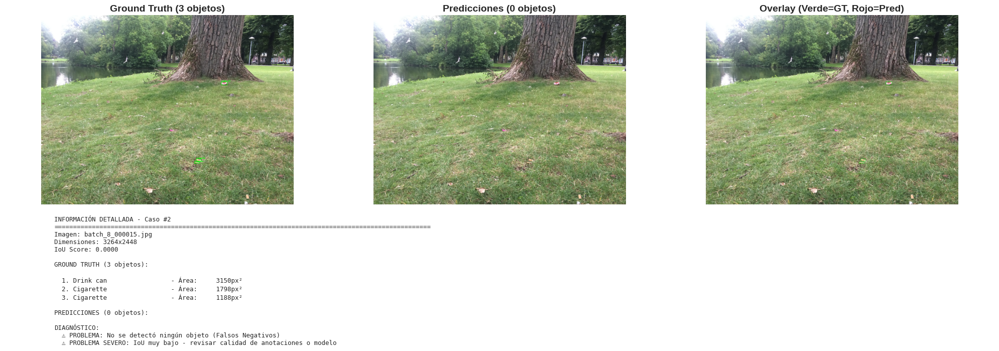

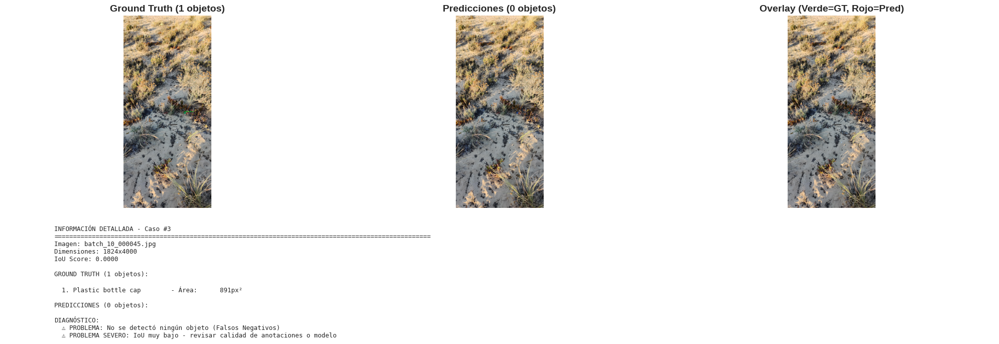

In [36]:
# Visualizar caso individual con análisis detallado
def visualize_detailed_case(case_idx):
    """Visualiza un caso específico con información detallada"""
    case = image_scores[case_idx]
    img_path = case['path']
    
    # Cargar imagen
    image = cv2.imread(str(img_path))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w = image_rgb.shape[:2]
    
    # Cargar GT
    label_path = val_labels_dir / f"{img_path.stem}.txt"
    gt_info = []
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                cls_id = int(parts[0])
                x_c, y_c, box_w, box_h = [float(x) for x in parts[1:5]]
                x1 = int((x_c - box_w/2) * w)
                y1 = int((y_c - box_h/2) * h)
                x2 = int((x_c + box_w/2) * w)
                y2 = int((y_c + box_h/2) * h)
                gt_info.append({
                    'class': class_names[cls_id],
                    'class_id': cls_id,
                    'bbox': [x1, y1, x2, y2],
                    'area': (x2-x1) * (y2-y1)
                })
    
    # Predecir
    results = model.predict(str(img_path), conf=0.25, iou=0.45, verbose=False)
    pred_info = []
    if len(results) > 0 and results[0].boxes is not None:
        boxes = results[0].boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
            conf = box.conf[0].cpu().numpy()
            cls = int(box.cls[0].cpu().numpy())
            pred_info.append({
                'class': class_names[cls],
                'class_id': cls,
                'bbox': [x1, y1, x2, y2],
                'conf': conf,
                'area': (x2-x1) * (y2-y1)
            })
    
    # Crear figura con 3 subplots
    fig = plt.figure(figsize=(20, 7))
    gs = fig.add_gridspec(2, 3, height_ratios=[3, 1])
    
    # Ground Truth
    ax1 = fig.add_subplot(gs[0, 0])
    img_gt = image_rgb.copy()
    for i, gt in enumerate(gt_info):
        x1, y1, x2, y2 = gt['bbox']
        cv2.rectangle(img_gt, (x1, y1), (x2, y2), (0, 255, 0), 3)
        cv2.putText(img_gt, f"{i+1}: {gt['class']}", (x1, y1-5),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
    ax1.imshow(img_gt)
    ax1.set_title(f'Ground Truth ({len(gt_info)} objetos)', fontsize=14, fontweight='bold')
    ax1.axis('off')
    
    # Predicciones
    ax2 = fig.add_subplot(gs[0, 1])
    img_pred = image_rgb.copy()
    for i, pred in enumerate(pred_info):
        x1, y1, x2, y2 = pred['bbox']
        cv2.rectangle(img_pred, (x1, y1), (x2, y2), (255, 0, 0), 3)
        cv2.putText(img_pred, f"{i+1}: {pred['class']} ({pred['conf']:.2f})", (x1, y1-5),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
    ax2.imshow(img_pred)
    ax2.set_title(f'Predicciones ({len(pred_info)} objetos)', fontsize=14, fontweight='bold')
    ax2.axis('off')
    
    # Overlay
    ax3 = fig.add_subplot(gs[0, 2])
    img_overlay = image_rgb.copy()
    for gt in gt_info:
        x1, y1, x2, y2 = gt['bbox']
        cv2.rectangle(img_overlay, (x1, y1), (x2, y2), (0, 255, 0), 2)
    for pred in pred_info:
        x1, y1, x2, y2 = pred['bbox']
        cv2.rectangle(img_overlay, (x1, y1), (x2, y2), (255, 0, 0), 2)
    ax3.imshow(img_overlay)
    ax3.set_title('Overlay (Verde=GT, Rojo=Pred)', fontsize=14, fontweight='bold')
    ax3.axis('off')
    
    # Tabla de información
    ax4 = fig.add_subplot(gs[1, :])
    ax4.axis('off')
    
    info_text = f"""
INFORMACIÓN DETALLADA - Caso #{case_idx + 1}
{'='*100}
Imagen: {img_path.name}
Dimensiones: {w}x{h}
IoU Score: {case['score']:.4f}

GROUND TRUTH ({len(gt_info)} objetos):
"""
    for i, gt in enumerate(gt_info):
        info_text += f"\n  {i+1}. {gt['class']:25s} - Área: {gt['area']:8.0f}px²"
    
    info_text += f"\n\nPREDICCIONES ({len(pred_info)} objetos):"
    for i, pred in enumerate(pred_info):
        # Calcular mejor match con GT
        best_iou = 0
        best_gt_idx = -1
        for gt_idx, gt in enumerate(gt_info):
            iou = calculate_iou(pred['bbox'], gt['bbox'])
            if iou > best_iou:
                best_iou = iou
                best_gt_idx = gt_idx
        
        match_str = f"Match GT#{best_gt_idx+1} (IoU:{best_iou:.3f})" if best_gt_idx >= 0 else "Sin match"
        info_text += f"\n  {i+1}. {pred['class']:25s} - Conf: {pred['conf']:.3f} - Área: {pred['area']:8.0f}px² - {match_str}"
    
    # Diagnóstico
    info_text += "\n\nDIAGNÓSTICO:"
    if len(pred_info) == 0:
        info_text += "\n  ⚠ PROBLEMA: No se detectó ningún objeto (Falsos Negativos)"
    elif len(pred_info) < len(gt_info):
        info_text += f"\n  ⚠ PROBLEMA: Objetos no detectados ({len(gt_info) - len(pred_info)} falsos negativos)"
    elif len(pred_info) > len(gt_info):
        info_text += f"\n  ⚠ PROBLEMA: Detecciones espurias ({len(pred_info) - len(gt_info)} falsos positivos)"
    
    if case['score'] < 0.3:
        info_text += "\n  ⚠ PROBLEMA SEVERO: IoU muy bajo - revisar calidad de anotaciones o modelo"
    
    ax4.text(0.05, 0.95, info_text, transform=ax4.transAxes, 
            fontfamily='monospace', fontsize=9, verticalalignment='top')
    
    plt.tight_layout()
    plt.show()

# Visualizar los 3 peores casos individuales
print("ANÁLISIS DETALLADO DE CASOS INDIVIDUALES")
print("="*60)
for i in range(min(3, len(image_scores))):
    visualize_detailed_case(i)


EJEMPLOS DE OBJETOS PEQUEÑOS NO DETECTADOS


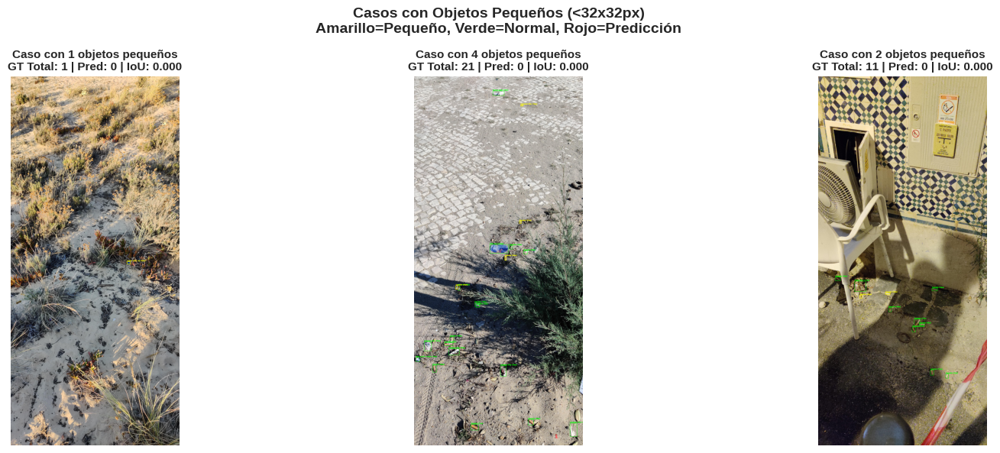

In [37]:
# Visualizar ejemplos específicos de objetos pequeños no detectados
print("\nEJEMPLOS DE OBJETOS PEQUEÑOS NO DETECTADOS")
print("="*60)

# Encontrar casos con objetos pequeños no detectados
small_not_detected_cases = []
for case in image_scores[:30]:
    img_path = case['path']
    label_path = val_labels_dir / f"{img_path.stem}.txt"
    
    img_temp = Image.open(img_path)
    img_w, img_h = img_temp.size
    
    # Buscar objetos pequeños en GT
    has_small = False
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                x_c, y_c, box_w, box_h = [float(x) for x in parts[1:5]]
                area = (box_w * img_w) * (box_h * img_h)
                if area < 32*32:  # Objeto pequeño
                    has_small = True
                    break
    
    if has_small:
        small_not_detected_cases.append(case)
    
    if len(small_not_detected_cases) >= 3:
        break

# Visualizar 3 casos
if len(small_not_detected_cases) > 0:
    fig, axes = plt.subplots(1, min(3, len(small_not_detected_cases)), figsize=(18, 6))
    if len(small_not_detected_cases) == 1:
        axes = [axes]
    
    for idx, case in enumerate(small_not_detected_cases[:3]):
        img_path = case['path']
        label_path = val_labels_dir / f"{img_path.stem}.txt"
        
        # Cargar imagen
        image = cv2.imread(str(img_path))
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w = image_rgb.shape[:2]
        
        # Cargar GT y marcar objetos pequeños
        small_count = 0
        if label_path.exists():
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    cls_id = int(parts[0])
                    x_c, y_c, box_w, box_h = [float(x) for x in parts[1:5]]
                    
                    x1 = int((x_c - box_w/2) * w)
                    y1 = int((y_c - box_h/2) * h)
                    x2 = int((x_c + box_w/2) * w)
                    y2 = int((y_c + box_h/2) * h)
                    
                    area = (x2-x1) * (y2-y1)
                    is_small = area < 32*32
                    
                    if is_small:
                        small_count += 1
                        color = (255, 255, 0)  # Amarillo para pequeños
                        thickness = 3
                    else:
                        color = (0, 255, 0)  # Verde para normales
                        thickness = 2
                    
                    cv2.rectangle(image_rgb, (x1, y1), (x2, y2), color, thickness)
                    label_text = f"{class_names[cls_id]} ({int(np.sqrt(area))}px)"
                    cv2.putText(image_rgb, label_text, (x1, y1-5),
                               cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
        
        # Predicciones en rojo
        results = model.predict(str(img_path), conf=0.25, iou=0.45, verbose=False)
        pred_count = 0
        if len(results) > 0 and results[0].boxes is not None:
            boxes = results[0].boxes
            pred_count = len(boxes)
            for box in boxes:
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)
        
        axes[idx].imshow(image_rgb)
        axes[idx].set_title(f'Caso con {small_count} objetos pequeños\n'
                           f'GT Total: {case["num_gt"]} | Pred: {pred_count} | IoU: {case["score"]:.3f}',
                           fontsize=11, fontweight='bold')
        axes[idx].axis('off')
    
    plt.suptitle('Casos con Objetos Pequeños (<32x32px)\nAmarillo=Pequeño, Verde=Normal, Rojo=Predicción',
                fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print("No se encontraron casos con objetos pequeños en los primeros 30 peores casos")

ANÁLISIS DE TAMAÑO DE OBJETOS EN PEORES CASOS

ESTADÍSTICAS POR TAMAÑO (categorías COCO):
Categoría     Count   IoU Prom   Detectados   Tasa Detec
------------------------------------------------------------
small            17      0.000            0         0.0%
medium          112      0.067            9         8.0%
large           119      0.191           26        21.8%

DISTRIBUCIÓN DE TAMAÑOS:
  Pequeños (<32x32px): 17
  Medianos (32-96px): 112
  Grandes (>96px): 119

OBJETOS NO DETECTADOS (IoU < 0.5): 213
  Pequeños: 17 (8.0%)
  Medianos: 103 (48.4%)
  Grandes: 93 (43.7%)

ESTADÍSTICAS POR TAMAÑO (categorías COCO):
Categoría     Count   IoU Prom   Detectados   Tasa Detec
------------------------------------------------------------
small            17      0.000            0         0.0%
medium          112      0.067            9         8.0%
large           119      0.191           26        21.8%

DISTRIBUCIÓN DE TAMAÑOS:
  Pequeños (<32x32px): 17
  Medianos (32-96px): 112
 

/tmp/ipykernel_125397/2876929663.py:140: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  detection_rates = df_size.groupby('size_bin')['detected'].agg(['sum', 'count'])


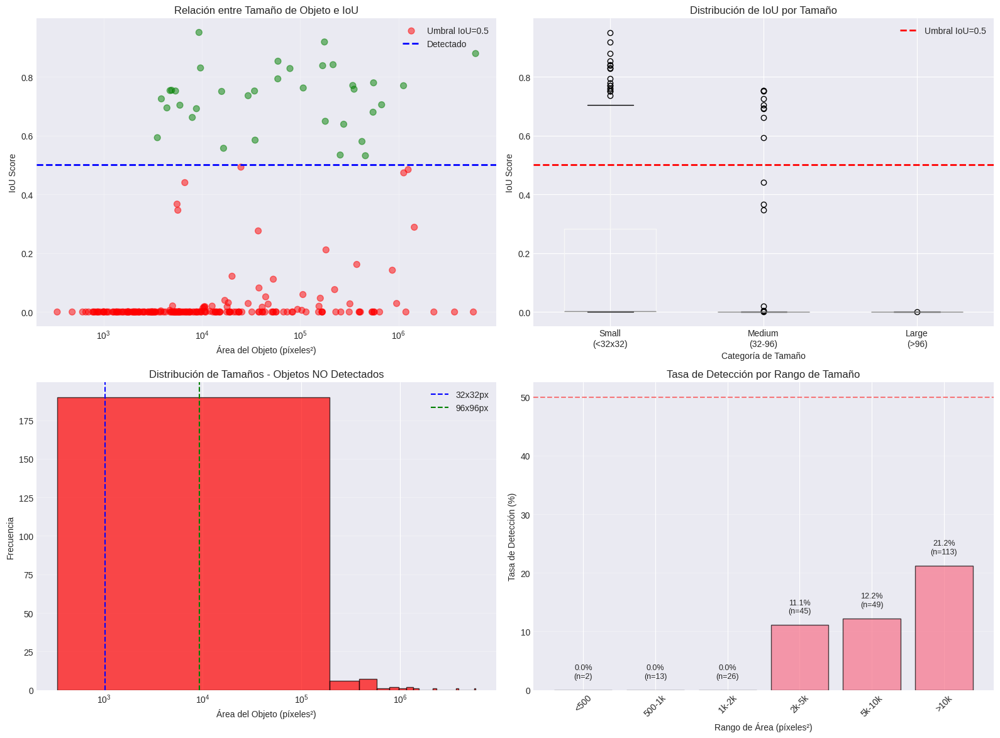


CONCLUSIONES:
⚠ PROBLEMA CONFIRMADO: Objetos pequeños tienen baja tasa de detección
  Recomendaciones:
  - Usar imágenes de mayor resolución durante entrenamiento
  - Ajustar anchors para objetos pequeños
  - Considerar multi-scale training
  - Usar técnicas de zoom/crop durante augmentation

Área mediana de objetos NO detectados: 6716px²
Equivalente a: ~82x82px


In [38]:
# Analizar relación entre tamaño de objeto e IoU
print("ANÁLISIS DE TAMAÑO DE OBJETOS EN PEORES CASOS")
print("="*60)

# Recopilar datos de todos los casos analizados
size_iou_data = []

for case in image_scores[:50]:  # Analizar más casos para mejor estadística
    img_path = case['path']
    label_path = val_labels_dir / f"{img_path.stem}.txt"
    
    # Cargar imagen para obtener dimensiones
    img_temp = Image.open(img_path)
    img_w, img_h = img_temp.size
    img_area = img_w * img_h
    
    # Cargar GT
    gt_boxes = []
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                x_c, y_c, box_w, box_h = [float(x) for x in parts[1:5]]
                x1 = (x_c - box_w/2) * img_w
                y1 = (y_c - box_h/2) * img_h
                x2 = (x_c + box_w/2) * img_w
                y2 = (y_c + box_h/2) * img_h
                gt_boxes.append([x1, y1, x2, y2])
    
    # Predecir
    results = model.predict(str(img_path), conf=0.25, iou=0.45, verbose=False)
    pred_boxes = []
    if len(results) > 0 and results[0].boxes is not None:
        pred_boxes = results[0].boxes.xyxy.cpu().numpy()
    
    # Calcular IoU y tamaño para cada GT box
    for gt_box in gt_boxes:
        gt_area = (gt_box[2] - gt_box[0]) * (gt_box[3] - gt_box[1])
        gt_area_pct = (gt_area / img_area) * 100  # Porcentaje del área de la imagen
        
        # Clasificar por tamaño según COCO
        if gt_area < 32*32:
            size_category = 'small'
        elif gt_area < 96*96:
            size_category = 'medium'
        else:
            size_category = 'large'
        
        # Encontrar mejor IoU con predicciones
        max_iou = 0
        for pred_box in pred_boxes:
            iou = calculate_iou(gt_box, pred_box)
            max_iou = max(max_iou, iou)
        
        size_iou_data.append({
            'area_pixels': gt_area,
            'area_percent': gt_area_pct,
            'width': gt_box[2] - gt_box[0],
            'height': gt_box[3] - gt_box[1],
            'iou': max_iou,
            'size_category': size_category,
            'detected': max_iou >= 0.5
        })

# Convertir a DataFrame
df_size = pd.DataFrame(size_iou_data)

# Estadísticas por categoría de tamaño
print("\nESTADÍSTICAS POR TAMAÑO (categorías COCO):")
print(f"{'Categoría':10s} {'Count':>8s} {'IoU Prom':>10s} {'Detectados':>12s} {'Tasa Detec':>12s}")
print("-"*60)

for cat in ['small', 'medium', 'large']:
    cat_data = df_size[df_size['size_category'] == cat]
    if len(cat_data) > 0:
        avg_iou = cat_data['iou'].mean()
        detected_count = cat_data['detected'].sum()
        detection_rate = (detected_count / len(cat_data)) * 100
        print(f"{cat:10s} {len(cat_data):8d} {avg_iou:10.3f} {detected_count:12d} {detection_rate:11.1f}%")

print("\nDISTRIBUCIÓN DE TAMAÑOS:")
print(f"  Pequeños (<32x32px): {len(df_size[df_size['size_category']=='small'])}")
print(f"  Medianos (32-96px): {len(df_size[df_size['size_category']=='medium'])}")
print(f"  Grandes (>96px): {len(df_size[df_size['size_category']=='large'])}")

# Análisis de objetos no detectados
not_detected = df_size[df_size['iou'] < 0.5]
print(f"\nOBJETOS NO DETECTADOS (IoU < 0.5): {len(not_detected)}")
print(f"  Pequeños: {len(not_detected[not_detected['size_category']=='small'])} ({len(not_detected[not_detected['size_category']=='small'])/len(not_detected)*100:.1f}%)")
print(f"  Medianos: {len(not_detected[not_detected['size_category']=='medium'])} ({len(not_detected[not_detected['size_category']=='medium'])/len(not_detected)*100:.1f}%)")
print(f"  Grandes: {len(not_detected[not_detected['size_category']=='large'])} ({len(not_detected[not_detected['size_category']=='large'])/len(not_detected)*100:.1f}%)")

# Visualizaciones
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Scatter: Área vs IoU
ax = axes[0, 0]
scatter = ax.scatter(df_size['area_pixels'], df_size['iou'], 
                    c=df_size['detected'].map({True: 'green', False: 'red'}),
                    alpha=0.5, s=50)
ax.axhline(y=0.5, color='blue', linestyle='--', linewidth=2, label='Umbral IoU=0.5')
ax.set_xlabel('Área del Objeto (píxeles²)')
ax.set_ylabel('IoU Score')
ax.set_title('Relación entre Tamaño de Objeto e IoU')
ax.set_xscale('log')
ax.legend(['Umbral IoU=0.5', 'Detectado', 'No detectado'])
ax.grid(True, alpha=0.3)

# 2. Box plot: IoU por categoría
ax = axes[0, 1]
df_size.boxplot(column='iou', by='size_category', ax=ax, 
               positions=[0, 1, 2], widths=0.6)
ax.axhline(y=0.5, color='red', linestyle='--', linewidth=2, label='Umbral IoU=0.5')
ax.set_xlabel('Categoría de Tamaño')
ax.set_ylabel('IoU Score')
ax.set_title('Distribución de IoU por Tamaño')
ax.legend()
plt.sca(ax)
plt.xticks([0, 1, 2], ['Small\n(<32x32)', 'Medium\n(32-96)', 'Large\n(>96)'])
ax.get_figure().suptitle('')  # Remover título automático de boxplot

# 3. Histograma de áreas (objetos no detectados)
ax = axes[1, 0]
ax.hist(not_detected['area_pixels'], bins=30, alpha=0.7, color='red', edgecolor='black')
ax.set_xlabel('Área del Objeto (píxeles²)')
ax.set_ylabel('Frecuencia')
ax.set_title('Distribución de Tamaños - Objetos NO Detectados')
ax.set_xscale('log')
ax.grid(True, alpha=0.3, axis='y')
ax.axvline(x=32*32, color='blue', linestyle='--', label='32x32px')
ax.axvline(x=96*96, color='green', linestyle='--', label='96x96px')
ax.legend()

# 4. Tasas de detección por bins de tamaño
ax = axes[1, 1]
bins = [0, 500, 1000, 2000, 5000, 10000, df_size['area_pixels'].max()]
bin_labels = ['<500', '500-1k', '1k-2k', '2k-5k', '5k-10k', '>10k']
df_size['size_bin'] = pd.cut(df_size['area_pixels'], bins=bins, labels=bin_labels)

detection_rates = df_size.groupby('size_bin')['detected'].agg(['sum', 'count'])
detection_rates['rate'] = (detection_rates['sum'] / detection_rates['count']) * 100

ax.bar(range(len(detection_rates)), detection_rates['rate'], alpha=0.7, edgecolor='black')
ax.set_xticks(range(len(detection_rates)))
ax.set_xticklabels(detection_rates.index, rotation=45)
ax.set_ylabel('Tasa de Detección (%)')
ax.set_xlabel('Rango de Área (píxeles²)')
ax.set_title('Tasa de Detección por Rango de Tamaño')
ax.axhline(y=50, color='red', linestyle='--', alpha=0.5)
ax.grid(True, alpha=0.3, axis='y')

# Agregar valores en las barras
for i, (idx, row) in enumerate(detection_rates.iterrows()):
    ax.text(i, row['rate'] + 2, f"{row['rate']:.1f}%\n(n={int(row['count'])})", 
           ha='center', fontsize=9)

plt.tight_layout()
plt.show()

# Conclusiones
print("\n" + "="*60)
print("CONCLUSIONES:")
if df_size[df_size['size_category']=='small']['detected'].mean() < 0.5:
    print("⚠ PROBLEMA CONFIRMADO: Objetos pequeños tienen baja tasa de detección")
    print("  Recomendaciones:")
    print("  - Usar imágenes de mayor resolución durante entrenamiento")
    print("  - Ajustar anchors para objetos pequeños")
    print("  - Considerar multi-scale training")
    print("  - Usar técnicas de zoom/crop durante augmentation")
else:
    print("✓ Detección de objetos pequeños es aceptable")

avg_area_not_detected = not_detected['area_pixels'].median()
print(f"\nÁrea mediana de objetos NO detectados: {avg_area_not_detected:.0f}px²")
print(f"Equivalente a: ~{np.sqrt(avg_area_not_detected):.0f}x{np.sqrt(avg_area_not_detected):.0f}px")

### 4.4 Análisis de Tamaño de Objetos

Los objetos pequeños suelen tener IoU bajo incluso con detecciones correctas, ya que pequeños errores de píxeles representan gran porcentaje del área.

# ============================================================================
# 4.5 ANÁLISIS DE CALIDAD DE IMAGEN (Brillo, Contraste, Ruido)
# ============================================================================

ANÁLISIS DE CALIDAD DE IMAGEN EN PEORES CASOS

COMPARACIÓN: PEORES CASOS vs CASOS ALEATORIOS
------------------------------------------------------------
Métrica              Peores (μ±σ)         Random (μ±σ)            p-value   Signif
------------------------------------------------------------
brightness            126.52±25.92       115.91±25.39          0.1206       NS
contrast               54.25±11.41        55.48±14.20          0.7158       NS
sharpness            1231.79±1167.18      1701.95±2296.99          0.3299       NS
noise                   1.33± 0.89         1.55± 1.53          0.4959       NS
color_diversity        37.13±16.49        43.66±14.67          0.1167       NS

COMPARACIÓN: PEORES CASOS vs CASOS ALEATORIOS
------------------------------------------------------------
Métrica              Peores (μ±σ)         Random (μ±σ)            p-value   Signif
------------------------------------------------------------
brightness            126.52±25.92       115.91±25.

/tmp/ipykernel_125397/1127597013.py:108: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=['Peores\nCasos', 'Casos\nAleatorios'],
/tmp/ipykernel_125397/1127597013.py:108: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=['Peores\nCasos', 'Casos\nAleatorios'],
/tmp/ipykernel_125397/1127597013.py:108: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data_to_plot, labels=['Peores\nCasos', 'Casos\nAleatorios'],
/tmp/ipykernel_125397/1127597013.py:108: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_lab

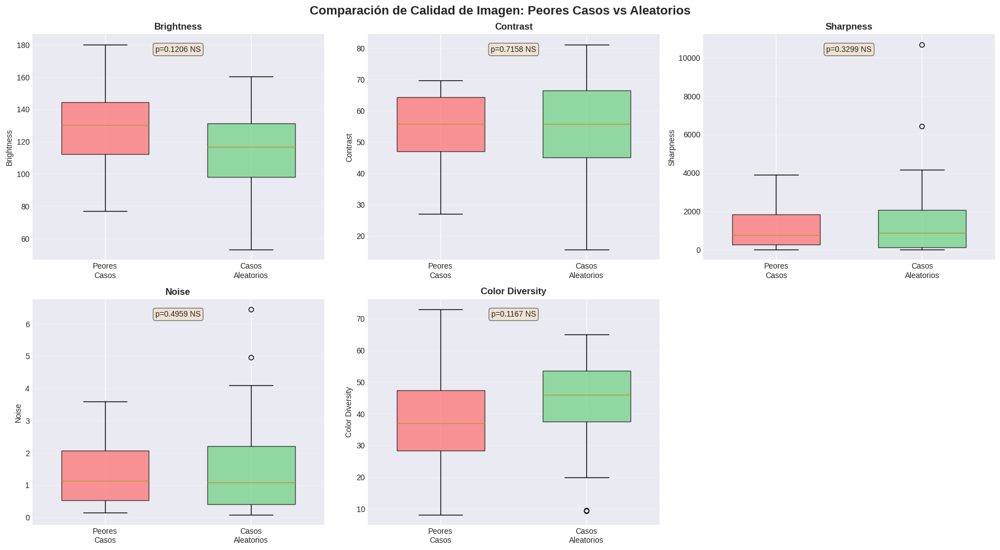


HALLAZGOS PRINCIPALES:

✓ No se encontraron diferencias significativas en calidad de imagen
  → El problema NO parece estar relacionado con brillo/contraste/ruido
  → Revisar complejidad de escenas, oclusiones, o calidad de anotaciones

CORRELACIÓN DE MÉTRICAS DE CALIDAD CON IoU
brightness          : r=-0.025, p=0.8967 NS
contrast            : r=-0.058, p=0.7608 NS
sharpness           : r=-0.155, p=0.4136 NS
noise               : r=-0.186, p=0.3261 NS
color_diversity     : r=-0.015, p=0.9384 NS


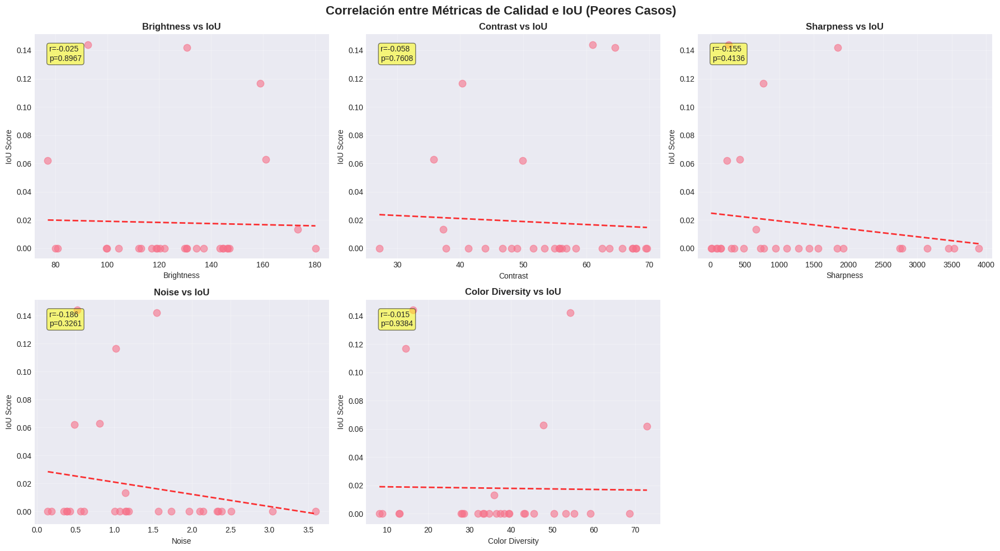


MATRIZ DE CORRELACIÓN (todos los features + IoU):


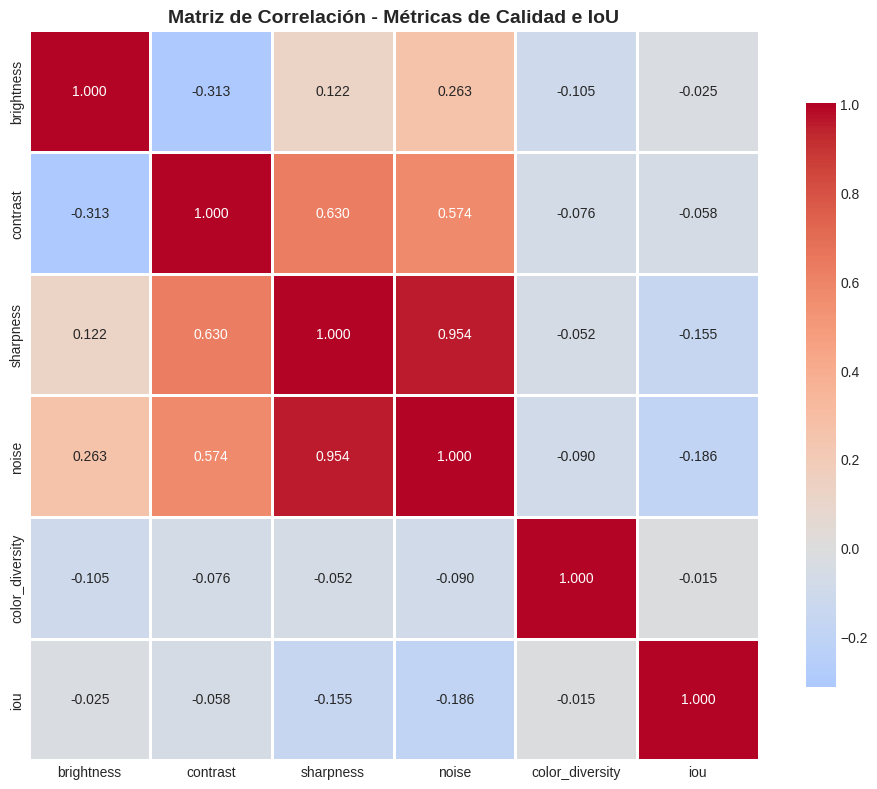


CASOS EXTREMOS IDENTIFICADOS

Casos MUY OSCUROS (brightness < 91.3): 3
  IoU promedio: 0.021

Casos MUY BRILLANTES (brightness > 159.2): 3
  IoU promedio: 0.025

Casos BAJO CONTRASTE (contrast < 37.7): 3
  IoU promedio: 0.025

Casos ALTO RUIDO (noise > 2.4): 3
  IoU promedio: 0.000

Casos BAJA NITIDEZ/BLUR (sharpness < 98.8): 3
  IoU promedio: 0.000

VISUALIZANDO EJEMPLOS DE PROBLEMAS DE CALIDAD


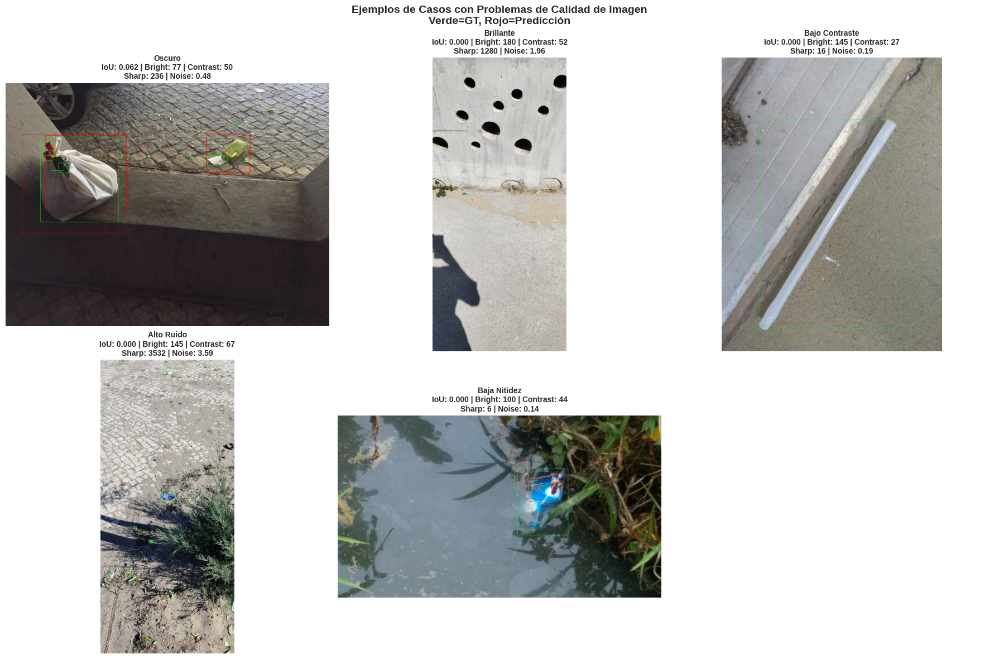


CONCLUSIONES SOBRE CALIDAD DE IMAGEN

✓ NO se encontraron problemas sistemáticos de calidad de imagen

El bajo desempeño probablemente se debe a:
  • Complejidad de las escenas (múltiples objetos, oclusiones)
  • Problemas en las anotaciones (mal etiquetado, objetos pequeños)
  • Variabilidad de fondos y contextos
  • Objetos en poses/orientaciones difíciles



In [42]:
from scipy import stats
from skimage import exposure

def calculate_image_quality_metrics(img_path):
    """Calcula métricas de calidad de imagen"""
    # Cargar imagen
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # 1. Brillo (brightness) - promedio de intensidad
    brightness = np.mean(gray)
    
    # 2. Contraste - desviación estándar de intensidades
    contrast = np.std(gray)
    
    # 3. Nitidez (sharpness) - Varianza del Laplaciano
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    sharpness = laplacian.var()
    
    # 4. Ruido estimado (usando MAD - Median Absolute Deviation)
    # Método basado en wavelets para estimar ruido
    H, W = gray.shape
    M = [[1, -2, 1],
         [-2, 4, -2],
         [1, -2, 1]]
    sigma = np.sum(np.sum(np.absolute(cv2.filter2D(gray, -1, np.array(M)))))
    sigma = sigma * np.sqrt(0.5 * np.pi) / (6 * (W-2) * (H-2))
    
    # 5. Diversidad de color (en HSV)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    color_diversity = np.std(hsv[:,:,0])  # Varianza en Hue
    
    return {
        'brightness': brightness,
        'contrast': contrast,
        'sharpness': sharpness,
        'noise': sigma,
        'color_diversity': color_diversity
    }

print("ANÁLISIS DE CALIDAD DE IMAGEN EN PEORES CASOS")
print("="*60)

# Calcular métricas para los 30 peores casos
worst_30_quality = []
for case in image_scores[:30]:
    metrics = calculate_image_quality_metrics(case['path'])
    metrics['iou'] = case['score']
    metrics['path'] = case['path']
    worst_30_quality.append(metrics)

# Calcular métricas para 30 casos aleatorios (baseline)
random_indices = np.random.choice(len(image_scores[50:]), size=30, replace=False)
random_quality = []
for idx in random_indices:
    case = image_scores[50 + idx]
    metrics = calculate_image_quality_metrics(case['path'])
    metrics['iou'] = case['score']
    metrics['path'] = case['path']
    random_quality.append(metrics)

# Convertir a DataFrames
df_worst = pd.DataFrame(worst_30_quality)
df_random = pd.DataFrame(random_quality)

# Comparación estadística
print("\nCOMPARACIÓN: PEORES CASOS vs CASOS ALEATORIOS")
print("-"*60)
print(f"{'Métrica':20s} {'Peores (μ±σ)':20s} {'Random (μ±σ)':20s} {'p-value':>10s} {'Signif':>8s}")
print("-"*60)

metrics_to_compare = ['brightness', 'contrast', 'sharpness', 'noise', 'color_diversity']
comparison_results = {}

for metric in metrics_to_compare:
    worst_vals = df_worst[metric].values
    random_vals = df_random[metric].values
    
    # Test t de Student
    t_stat, p_value = stats.ttest_ind(worst_vals, random_vals)
    
    worst_mean = worst_vals.mean()
    worst_std = worst_vals.std()
    random_mean = random_vals.mean()
    random_std = random_vals.std()
    
    is_significant = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < 0.05 else "NS"
    
    print(f"{metric:20s} {worst_mean:7.2f}±{worst_std:5.2f}      {random_mean:7.2f}±{random_std:5.2f}      {p_value:10.4f} {is_significant:>8s}")
    
    comparison_results[metric] = {
        'worst_mean': worst_mean,
        'random_mean': random_mean,
        'p_value': p_value,
        'significant': p_value < 0.05
    }

# Visualización comparativa
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, metric in enumerate(metrics_to_compare):
    ax = axes[idx]
    
    # Box plots
    data_to_plot = [df_worst[metric].values, df_random[metric].values]
    bp = ax.boxplot(data_to_plot, labels=['Peores\nCasos', 'Casos\nAleatorios'],
                    patch_artist=True, widths=0.6)
    
    # Colorear
    bp['boxes'][0].set_facecolor('#ff6b6b')
    bp['boxes'][1].set_facecolor('#6bcf7f')
    
    for box in bp['boxes']:
        box.set_alpha(0.7)
    
    # Agregar p-value
    p_val = comparison_results[metric]['p_value']
    sig_text = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else "NS"
    ax.text(0.5, 0.95, f'p={p_val:.4f} {sig_text}', 
            transform=ax.transAxes, ha='center', va='top',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    ax.set_ylabel(metric.replace('_', ' ').title())
    ax.set_title(f'{metric.replace("_", " ").title()}', fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y')

# Ocultar último subplot si no se usa
axes[5].axis('off')

plt.suptitle('Comparación de Calidad de Imagen: Peores Casos vs Aleatorios', 
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Resumen de hallazgos
print("\n" + "="*60)
print("HALLAZGOS PRINCIPALES:")
print("="*60)
significant_diffs = [m for m in metrics_to_compare if comparison_results[m]['significant']]

if len(significant_diffs) > 0:
    print("\n⚠ Se encontraron diferencias significativas en:")
    for metric in significant_diffs:
        worst_m = comparison_results[metric]['worst_mean']
        rand_m = comparison_results[metric]['random_mean']
        diff_pct = ((worst_m - rand_m) / rand_m) * 100
        direction = "mayor" if worst_m > rand_m else "menor"
        print(f"  • {metric}: {direction} en {abs(diff_pct):.1f}% en peores casos")
else:
    print("\n✓ No se encontraron diferencias significativas en calidad de imagen")
    print("  → El problema NO parece estar relacionado con brillo/contraste/ruido")
    print("  → Revisar complejidad de escenas, oclusiones, o calidad de anotaciones")

# ============================================================================
# ANÁLISIS DE CORRELACIÓN CON IoU
# ============================================================================

print("\n" + "="*60)
print("CORRELACIÓN DE MÉTRICAS DE CALIDAD CON IoU")
print("="*60)

# Calcular correlaciones
correlations = {}
for metric in metrics_to_compare:
    corr, p_val = stats.pearsonr(df_worst[metric].values, df_worst['iou'].values)
    correlations[metric] = {'corr': corr, 'p_value': p_val}
    sig = "*" if p_val < 0.05 else "NS"
    print(f"{metric:20s}: r={corr:6.3f}, p={p_val:.4f} {sig}")

# Visualización de correlaciones
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, metric in enumerate(metrics_to_compare):
    ax = axes[idx]
    
    # Scatter plot
    ax.scatter(df_worst[metric], df_worst['iou'], alpha=0.6, s=80)
    
    # Línea de tendencia
    z = np.polyfit(df_worst[metric], df_worst['iou'], 1)
    p = np.poly1d(z)
    x_line = np.linspace(df_worst[metric].min(), df_worst[metric].max(), 100)
    ax.plot(x_line, p(x_line), "r--", alpha=0.8, linewidth=2)
    
    # Anotaciones
    corr = correlations[metric]['corr']
    p_val = correlations[metric]['p_value']
    ax.text(0.05, 0.95, f'r={corr:.3f}\np={p_val:.4f}', 
            transform=ax.transAxes, va='top',
            bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.5))
    
    ax.set_xlabel(metric.replace('_', ' ').title())
    ax.set_ylabel('IoU Score')
    ax.set_title(f'{metric.replace("_", " ").title()} vs IoU', fontweight='bold')
    ax.grid(True, alpha=0.3)

axes[5].axis('off')

plt.suptitle('Correlación entre Métricas de Calidad e IoU (Peores Casos)', 
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Matriz de correlación
print("\nMATRIZ DE CORRELACIÓN (todos los features + IoU):")
correlation_matrix = df_worst[metrics_to_compare + ['iou']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.3f', cmap='coolwarm', 
            center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8})
plt.title('Matriz de Correlación - Métricas de Calidad e IoU', fontweight='bold', fontsize=14)
plt.tight_layout()
plt.show()

# Identificar casos extremos
print("\n" + "="*60)
print("CASOS EXTREMOS IDENTIFICADOS")
print("="*60)

# Casos muy oscuros
dark_threshold = df_worst['brightness'].quantile(0.1)
dark_cases = df_worst[df_worst['brightness'] < dark_threshold]
print(f"\nCasos MUY OSCUROS (brightness < {dark_threshold:.1f}): {len(dark_cases)}")
if len(dark_cases) > 0:
    print(f"  IoU promedio: {dark_cases['iou'].mean():.3f}")

# Casos muy brillantes
bright_threshold = df_worst['brightness'].quantile(0.9)
bright_cases = df_worst[df_worst['brightness'] > bright_threshold]
print(f"\nCasos MUY BRILLANTES (brightness > {bright_threshold:.1f}): {len(bright_cases)}")
if len(bright_cases) > 0:
    print(f"  IoU promedio: {bright_cases['iou'].mean():.3f}")

# Casos con bajo contraste
low_contrast_threshold = df_worst['contrast'].quantile(0.1)
low_contrast_cases = df_worst[df_worst['contrast'] < low_contrast_threshold]
print(f"\nCasos BAJO CONTRASTE (contrast < {low_contrast_threshold:.1f}): {len(low_contrast_cases)}")
if len(low_contrast_cases) > 0:
    print(f"  IoU promedio: {low_contrast_cases['iou'].mean():.3f}")

# Casos con alto ruido
high_noise_threshold = df_worst['noise'].quantile(0.9)
high_noise_cases = df_worst[df_worst['noise'] > high_noise_threshold]
print(f"\nCasos ALTO RUIDO (noise > {high_noise_threshold:.1f}): {len(high_noise_cases)}")
if len(high_noise_cases) > 0:
    print(f"  IoU promedio: {high_noise_cases['iou'].mean():.3f}")

# Casos con baja nitidez (blur)
low_sharp_threshold = df_worst['sharpness'].quantile(0.1)
blur_cases = df_worst[df_worst['sharpness'] < low_sharp_threshold]
print(f"\nCasos BAJA NITIDEZ/BLUR (sharpness < {low_sharp_threshold:.1f}): {len(blur_cases)}")
if len(blur_cases) > 0:
    print(f"  IoU promedio: {blur_cases['iou'].mean():.3f}")

# ============================================================================
# VISUALIZACIÓN DE EJEMPLOS
# ============================================================================

print("\n" + "="*60)
print("VISUALIZANDO EJEMPLOS DE PROBLEMAS DE CALIDAD")
print("="*60)

# Función para encontrar ejemplo de cada tipo
def find_example(df, metric, threshold, comparison='<'):
    if comparison == '<':
        candidates = df[df[metric] < threshold].sort_values(metric)
    else:
        candidates = df[df[metric] > threshold].sort_values(metric, ascending=False)
    
    if len(candidates) > 0:
        return candidates.iloc[0]
    return None

# Buscar ejemplos
examples = {
    'Oscuro': find_example(df_worst, 'brightness', dark_threshold, '<'),
    'Brillante': find_example(df_worst, 'brightness', bright_threshold, '>'),
    'Bajo Contraste': find_example(df_worst, 'contrast', low_contrast_threshold, '<'),
    'Alto Ruido': find_example(df_worst, 'noise', high_noise_threshold, '>'),
    'Baja Nitidez': find_example(df_worst, 'sharpness', low_sharp_threshold, '<'),
}

# Visualizar ejemplos
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

example_idx = 0
for problem_type, example in examples.items():
    if example is not None and example_idx < 6:
        ax = axes[example_idx]
        
        # Cargar imagen
        img = cv2.imread(str(example['path']))
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img_rgb.shape[:2]
        
        # Cargar GT
        label_path = val_labels_dir / f"{example['path'].stem}.txt"
        if label_path.exists():
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    cls_id = int(parts[0])
                    x_c, y_c, box_w, box_h = [float(x) for x in parts[1:5]]
                    x1 = int((x_c - box_w/2) * w)
                    y1 = int((y_c - box_h/2) * h)
                    x2 = int((x_c + box_w/2) * w)
                    y2 = int((y_c + box_h/2) * h)
                    cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
        
        # Predicciones
        results = model.predict(str(example['path']), conf=0.25, iou=0.45, verbose=False)
        if len(results) > 0 and results[0].boxes is not None:
            for box in results[0].boxes:
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)
        
        ax.imshow(img_rgb)
        title = f'{problem_type}\n'
        title += f'IoU: {example["iou"]:.3f} | '
        title += f'Bright: {example["brightness"]:.0f} | Contrast: {example["contrast"]:.0f}\n'
        title += f'Sharp: {example["sharpness"]:.0f} | Noise: {example["noise"]:.2f}'
        ax.set_title(title, fontsize=10, fontweight='bold')
        ax.axis('off')
        
        example_idx += 1

# Ocultar axes no usados
for idx in range(example_idx, 6):
    axes[idx].axis('off')

plt.suptitle('Ejemplos de Casos con Problemas de Calidad de Imagen\nVerde=GT, Rojo=Predicción', 
            fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ============================================================================
# CONCLUSIONES FINALES
# ============================================================================

print("\n" + "="*60)
print("CONCLUSIONES SOBRE CALIDAD DE IMAGEN")
print("="*60)

if len(significant_diffs) > 0:
    print("\n✗ Se detectaron problemas de calidad de imagen en peores casos:")
    for metric in significant_diffs:
        print(f"  → {metric.replace('_', ' ').title()}")
    print("\nRECOMENDACIONES:")
    if 'brightness' in significant_diffs:
        print("  • Normalizar brillo durante preprocesamiento")
        print("  • Usar CLAHE (Contrast Limited Adaptive Histogram Equalization)")
    if 'contrast' in significant_diffs:
        print("  • Aplicar ecualización de histograma")
        print("  • Usar augmentation de contraste más agresivo")
    if 'noise' in significant_diffs:
        print("  • Aplicar filtros de denoise (bilateral, Non-local means)")
        print("  • Considerar augmentation con ruido para robustez")
    if 'sharpness' in significant_diffs:
        print("  • Aplicar filtros de sharpening")
        print("  • Revisar calidad de dataset (descartar imágenes muy borrosas)")
else:
    print("\n✓ NO se encontraron problemas sistemáticos de calidad de imagen")
    print("\nEl bajo desempeño probablemente se debe a:")
    print("  • Complejidad de las escenas (múltiples objetos, oclusiones)")
    print("  • Problemas en las anotaciones (mal etiquetado, objetos pequeños)")
    print("  • Variabilidad de fondos y contextos")
    print("  • Objetos en poses/orientaciones difíciles")
    
print("\n" + "="*60)

## 5. Análisis por Clase

Identifica qué clases tienen peor desempeño.

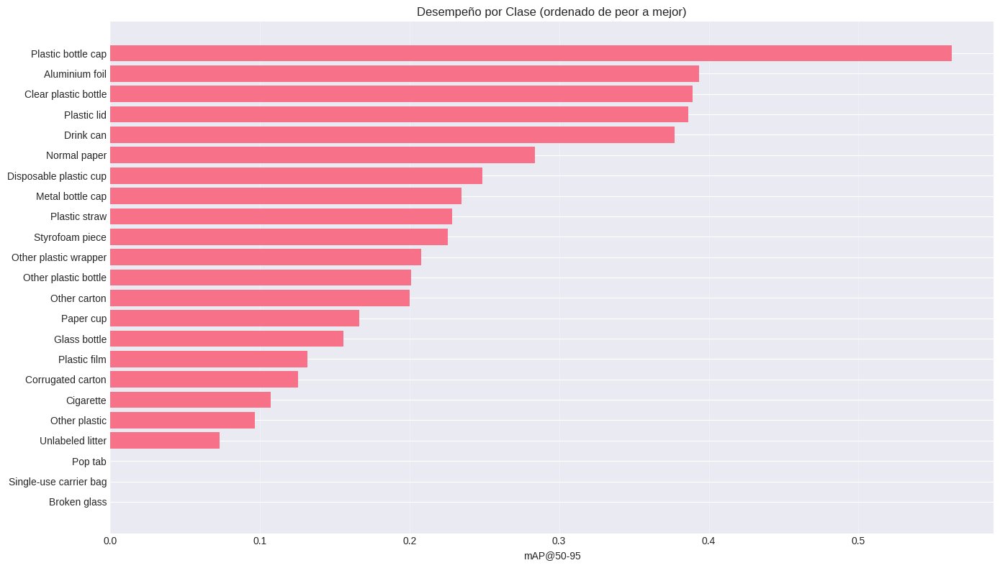


Peores 10 clases:
                 Class  Class_ID  mAP@50-95
          Broken glass         6   0.000000
Single-use carrier bag        17   0.000000
               Pop tab        18   0.000000
      Unlabeled litter        21   0.073032
         Other plastic        13   0.096690
             Cigarette        22   0.107284
     Corrugated carton         9   0.125373
          Plastic film        15   0.131651
          Glass bottle         3   0.156034
             Paper cup        10   0.166581

Mejores 10 clases:
                 Class  Class_ID  mAP@50-95
       Styrofoam piece        20   0.225521
         Plastic straw        19   0.228284
      Metal bottle cap         5   0.234597
Disposable plastic cup        11   0.248758
          Normal paper        14   0.284010
             Drink can         7   0.377254
           Plastic lid        12   0.386176
  Clear plastic bottle         2   0.388942
        Aluminium foil         0   0.393333
    Plastic bottle cap         4   0.

In [39]:
# Analizar métricas por clase (si están disponibles)
if hasattr(metrics.box, 'ap_class_index'):
    # Obtener mAP por clase usando el atributo correcto
    class_map = metrics.box.maps  # Usa 'maps' en lugar de 'map_per_class'
    class_indices = metrics.box.ap_class_index
    
    # Crear DataFrame
    class_performance = pd.DataFrame({
        'Class': [class_names[int(i)] for i in class_indices],
        'Class_ID': class_indices,
        'mAP@50-95': class_map
    })
    
    # Ordenar por peor mAP
    class_performance = class_performance.sort_values('mAP@50-95')
    
    # Visualizar
    plt.figure(figsize=(14, 8))
    plt.barh(range(len(class_performance)), class_performance['mAP@50-95'])
    plt.yticks(range(len(class_performance)), class_performance['Class'])
    plt.xlabel('mAP@50-95')
    plt.title('Desempeño por Clase (ordenado de peor a mejor)')
    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    print("\nPeores 10 clases:")
    print(class_performance.head(10).to_string(index=False))
    
    print("\nMejores 10 clases:")
    print(class_performance.tail(10).to_string(index=False))
else:
    print("Métricas por clase no disponibles en este formato")

## 6. Confusion Matrix

Visualiza qué clases se confunden entre sí.

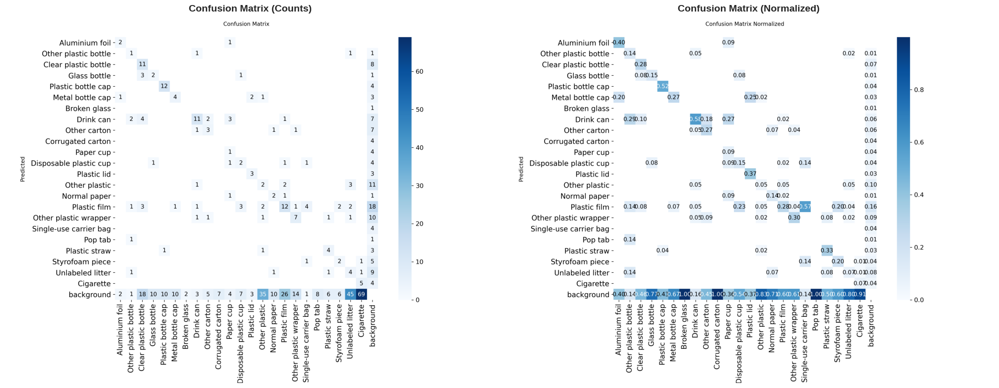

In [40]:
# Buscar confusion matrix guardada
confusion_matrix_path = results_dir / "confusion_matrix.png"
confusion_matrix_normalized_path = results_dir / "confusion_matrix_normalized.png"

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

if confusion_matrix_path.exists():
    img1 = Image.open(confusion_matrix_path)
    axes[0].imshow(img1)
    axes[0].set_title('Confusion Matrix (Counts)', fontsize=14, fontweight='bold')
    axes[0].axis('off')
else:
    axes[0].text(0.5, 0.5, 'Confusion Matrix no encontrada', 
                ha='center', va='center', fontsize=14)
    axes[0].axis('off')

if confusion_matrix_normalized_path.exists():
    img2 = Image.open(confusion_matrix_normalized_path)
    axes[1].imshow(img2)
    axes[1].set_title('Confusion Matrix (Normalized)', fontsize=14, fontweight='bold')
    axes[1].axis('off')
else:
    axes[1].text(0.5, 0.5, 'Confusion Matrix Normalized no encontrada', 
                ha='center', va='center', fontsize=14)
    axes[1].axis('off')

plt.tight_layout()
plt.show()

## 7. Resumen y Recomendaciones

In [41]:
print("="*80)
print("RESUMEN DEL ANÁLISIS")
print("="*80)
print(f"\nExperimento: {experiment_name}")
print(f"Épocas entrenadas: {len(df_results)}")
print(f"\nMejor Época: {best_epoch}")
print(f"  - mAP@50-95: {best_map:.4f}")
print(f"  - mAP@50: {df_results.loc[best_epoch, 'metrics/mAP50(B)']:.4f}")
print(f"  - Precision: {df_results.loc[best_epoch, 'metrics/precision(B)']:.4f}")
print(f"  - Recall: {df_results.loc[best_epoch, 'metrics/recall(B)']:.4f}")

print("\nRECOMENDACIONES:")
print("\n1. Basado en las pérdidas:")
final_train_loss = df_results['train/box_loss'].iloc[-1]
final_val_loss = df_results['val/box_loss'].iloc[-1]
if final_val_loss > final_train_loss * 1.5:
    print("   - OVERFITTING detectado: Val loss >> Train loss")
    print("   - Considerar más regularización o data augmentation")
else:
    print("   - Pérdidas balanceadas entre train y val")

print("\n2. Basado en las métricas:")
final_precision = df_results.loc[best_epoch, 'metrics/precision(B)']
final_recall = df_results.loc[best_epoch, 'metrics/recall(B)']
if final_precision > final_recall * 1.2:
    print("   - Precision > Recall: El modelo es conservador")
    print("   - Considerar reducir conf_threshold para aumentar recall")
elif final_recall > final_precision * 1.2:
    print("   - Recall > Precision: El modelo genera muchos falsos positivos")
    print("   - Considerar aumentar conf_threshold")
else:
    print("   - Precision y Recall balanceados")

print("\n3. Basado en peores predicciones:")
print(f"   - Analizar patrones comunes en los {len(image_scores[:10])} peores casos")
print("   - Considerar agregar más ejemplos similares al dataset")
print("   - Revisar si hay problemas de calidad de anotaciones")

print("\n" + "="*80)

RESUMEN DEL ANÁLISIS

Experimento: taco_detection_yolo11l_23c_aug_p100_fix_EXIF
Épocas entrenadas: 387

Mejor Época: 286
  - mAP@50-95: 0.1595
  - mAP@50: 0.2240
  - Precision: 0.2673
  - Recall: 0.2572

RECOMENDACIONES:

1. Basado en las pérdidas:
   - Pérdidas balanceadas entre train y val

2. Basado en las métricas:
   - Precision y Recall balanceados

3. Basado en peores predicciones:
   - Analizar patrones comunes en los 10 peores casos
   - Considerar agregar más ejemplos similares al dataset
   - Revisar si hay problemas de calidad de anotaciones

